# What affects the price of rental house in São Paulo?

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

%matplotlib inline
import warnings
warnings.simplefilter('ignore')
%config InlineBackend.figure_format='svg'

In [2]:
data=pd.read_csv('/Users/jidekickpush/Documents/GitHub/0323_2020DATAPAR/Projects/Team Project 3 - Brazil housing/Data/df_SaoPaulo_cleaned.csv')

In [3]:
data.head(1)

,city,area,rooms,bathroom,parking_spaces,floor,animal,furniture,hoa,rent_amount,property_tax,fire_insurance,total
0,São Paulo,70,2,1,1,7,1,1,2065,3300,211,42,5618


In [4]:
data.shape

(5887, 13)

In [5]:
df=data.copy()

In [6]:
columns_to_drop=['city','hoa','property_tax','fire_insurance','total']

In [7]:
df.drop(columns_to_drop,axis=1,inplace=True)

In [8]:
df.head()

,area,rooms,bathroom,parking_spaces,floor,animal,furniture,rent_amount
0,70,2,1,1,7,1,1,3300
1,320,4,4,0,20,1,0,4960
2,25,1,1,0,1,0,0,800
3,376,3,3,7,0,1,0,8000
4,213,4,4,4,4,1,0,3223


# Viz from São Paulo

In [9]:
df.corr()

,area,rooms,bathroom,parking_spaces,floor,animal,furniture,rent_amount
area,1.000000,0.306863,0.316543,0.300795,-0.038790,0.073565,-0.018145,0.274749
rooms,0.306863,1.000000,0.759432,0.645041,-0.092117,0.213963,-0.088931,0.537622
bathroom,0.316543,0.759432,1.000000,0.703530,-0.015503,0.159097,0.005864,0.638924
parking_spaces,0.300795,0.645041,0.703530,1.000000,-0.038378,0.165253,-0.015155,0.573373
floor,-0.038790,-0.092117,-0.015503,-0.038378,1.000000,-0.014202,0.135180,0.065294
animal,0.073565,0.213963,0.159097,0.165253,-0.014202,1.000000,-0.066208,0.107147
furniture,-0.018145,-0.088931,0.005864,-0.015155,0.135180,-0.066208,1.000000,0.154316
rent_amount,0.274749,0.537622,0.638924,0.573373,0.065294,0.107147,0.154316,1.000000


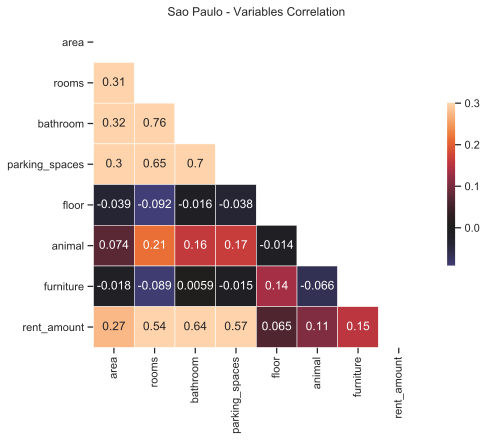

In [205]:
# your code here
from string import ascii_letters
sns.set(style="ticks")

# Compute the correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 6))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
plt.title('Sao Paulo - Variables Correlation')
f.savefig('SaoPaulo.png')

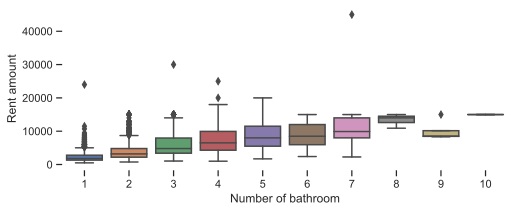

In [11]:
f, axe = plt.subplots(1, 1,figsize=(8,3))
sns.despine(left=True, bottom=True)
sns.boxplot(x=df['bathroom'],y=df['rent_amount'], ax=axe)
axe.yaxis.tick_left()
axe.set(xlabel='Number of bathroom', ylabel='Rent amount')
f.savefig('SaoPaulo_boxplot_bathroom.png')

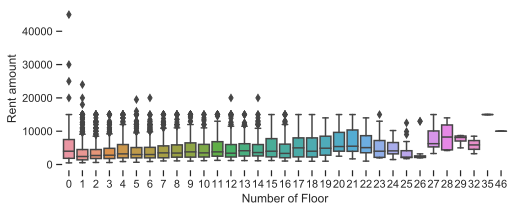

In [12]:
f, axe = plt.subplots(1, 1,figsize=(8,3))
sns.despine(left=True, bottom=True)
sns.boxplot(x=df['floor'],y=df['rent_amount'], ax=axe)
axe.yaxis.tick_left()
axe.set(xlabel='Number of Floor', ylabel='Rent amount')
f.savefig('SaoPaulo_boxplot_floor.png')

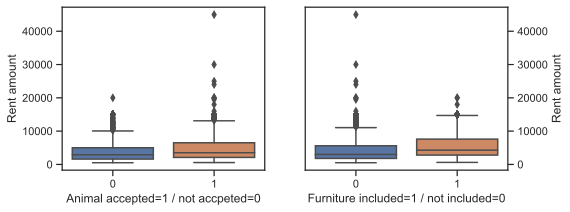

In [13]:
f, axes = plt.subplots(1, 2,figsize=(8,3))
sns.boxplot(x=df['animal'],y=df['rent_amount'], ax=axes[0])
sns.boxplot(x=df['furniture'],y=df['rent_amount'], ax=axes[1])
#sns.despine(left=True, bottom=True)
axes[0].set(xlabel='Animal accepted=1 / not accpeted=0', ylabel='Rent amount')
axes[0].yaxis.tick_left()
axes[1].yaxis.set_label_position("right")
axes[1].yaxis.tick_right()
axes[1].set(xlabel='Furniture included=1 / not included=0', ylabel='Rent amount')
f.savefig('SaoPaulo_boxplot_animalfurniture.png')

In [14]:
data._get_numeric_data().columns

Index(['area', 'rooms', 'bathroom', 'parking_spaces', 'floor', 'animal',
       'furniture', 'hoa', 'rent_amount', 'property_tax', 'fire_insurance',
       'total'],
      dtype='object')

In [12]:
num_features=list(set(data._get_numeric_data().columns)-set(['rent_amount','total','property_tax','fire_insurance']))

In [13]:
len(num_features)

8

In [14]:
#fig, axes=plt.subplots(4,2,figsize=(10,12))

#for idx,feature in enumerate(num_features):
#    ax=axes[int(idx/2),idx%2]
#    sns.boxplot(x='rent_amount', y= feature, data=data, ax=ax)
#    ax.set_xlabel('')
#    ax.set_ylabel(feature)

# Modeling

In [15]:
import statsmodels.api as sm
from statsmodels.tools.tools import add_constant

In [16]:
y=df.rent_amount
X=df.drop('rent_amount',axis=1)

In [17]:
model=sm.OLS(y,add_constant(X))

In [18]:
model_fit=model.fit()

In [19]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rent_amount   R-squared:                       0.474
Model:                            OLS   Adj. R-squared:                  0.474
Method:                 Least Squares   F-statistic:                     758.3
Date:                Sun, 03 May 2020   Prob (F-statistic):               0.00
Time:                        10:13:03   Log-Likelihood:                -54722.
No. Observations:                5887   AIC:                         1.095e+05
Df Residuals:                    5879   BIC:                         1.095e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -22.5630    107.233     -0.210      0.833    -232.779     187.653
area               0.6245      0.105      5.928      0.000       0.418       0.831
rooms            327.8044     47.867      6.848      0.000     233.968     421.640
bathroom         928.9253     39.351     23.606      0.000     851.783    1006.067
parking_spaces   481.1273     29.664     16.219      0.000     422.976     539.279
floor             42.4077      5.762      7.360      0.000      31.112      53.703
animal           -55.1524     82.701     -0.667      0.505    -217.278     106.973
furniture       1275.3948     78.819     16.181      0.000    1120.880    1429.909
==============================================================================
Omnibus:                     2105.259   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            18634.637
Skew:                           1.458   Prob(JB):                         0.00
Kurtosis:                      11.214   Cond. No.                     1.34e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.34e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [20]:
def func(column,X):
    #drop the column
    if column:
        X=X.drop(column, axis=1)
    # build the model
    model=sm.OLS(y,add_constant(X))
    #fit it
    model_fit=model.fit()
    #display the model
    display(model_fit.summary())
    #return X without the column
    return X

# P-Hacking

**P-value is probability of being wrong by rejecting Null Hypothesis**.

In [21]:
droped_columns=[]

In [22]:
droped_columns.append('animal')
print(droped_columns)
X=func(droped_columns[-1],X)

['animal']


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rent_amount   R-squared:                       0.474
Model:                            OLS   Adj. R-squared:                  0.474
Method:                 Least Squares   F-statistic:                     884.7
Date:                Sun, 03 May 2020   Prob (F-statistic):               0.00
Time:                        10:13:18   Log-Likelihood:                -54722.
No. Observations:                5887   AIC:                         1.095e+05
Df Residuals:                    5880   BIC:                         1.095e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -54.5603     95.896     -0.569      0.569    -242.551     133.430
area               0.6241      0.105      5.925      0.000       0.418       0.831
rooms            323.8787     47.501      6.818      0.000     230.759     416.998
bathroom         929.4390     39.341     23.625      0.000     852.315    1006.563
parking_spaces   480.2802     29.635     16.207      0.000     422.185     538.376
floor             42.3593      5.761      7.353      0.000      31.065      53.653
furniture       1278.0066     78.718     16.235      0.000    1123.690    1432.323
==============================================================================
Omnibus:                     2104.628   Durbin-Watson:                   2.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            18603.689
Skew:                           1.458   Prob(JB):                         0.00
Kurtosis:                      11.206   Cond. No.                     1.17e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [23]:
print('To optimize the model, here we removed', len(droped_columns), 'columns:', droped_columns)

To optimize the model, here we removed 1 columns: ['animal']


In [24]:
model=sm.OLS(y,add_constant(X))
model_fit=model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rent_amount   R-squared:                       0.474
Model:                            OLS   Adj. R-squared:                  0.474
Method:                 Least Squares   F-statistic:                     884.7
Date:                Sun, 03 May 2020   Prob (F-statistic):               0.00
Time:                        10:13:25   Log-Likelihood:                -54722.
No. Observations:                5887   AIC:                         1.095e+05
Df Residuals:                    5880   BIC:                         1.095e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -54.5603     95.896     -0.569      0.569    -242.551     133.430
area               0.6241      0.105      5.925      0.000       0.418       0.831
rooms            323.8787     47.501      6.818      0.000     230.759     416.998
bathroom         929.4390     39.341     23.625      0.000     852.315    1006.563
parking_spaces   480.2802     29.635     16.207      0.000     422.185     538.376
floor             42.3593      5.761      7.353      0.000      31.065      53.653
furniture       1278.0066     78.718     16.235      0.000    1123.690    1432.323
==============================================================================
Omnibus:                     2104.628   Durbin-Watson:                   2.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            18603.689
Skew:                           1.458   Prob(JB):                         0.00
Kurtosis:                      11.206   Cond. No.                     1.17e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [25]:
model_fit.save("fitted_model_SaoPaulo.pickle")

# Now we can study our y and y_pred

In [26]:
y=pd.DataFrame(data.rent_amount)

In [26]:
import statsmodels.api as sm

In [28]:
fitted_model=sm.load('fitted_model_SaoPaulo.pickle')

In [29]:
fitted_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rent_amount   R-squared:                       0.474
Model:                            OLS   Adj. R-squared:                  0.474
Method:                 Least Squares   F-statistic:                     884.7
Date:                Sun, 03 May 2020   Prob (F-statistic):               0.00
Time:                        10:13:38   Log-Likelihood:                -54722.
No. Observations:                5887   AIC:                         1.095e+05
Df Residuals:                    5880   BIC:                         1.095e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -54.5603     95.896     -0.569      0.569    -242.551     133.430
area               0.6241      0.105      5.925      0.000       0.418       0.831
rooms            323.8787     47.501      6.818      0.000     230.759     416.998
bathroom         929.4390     39.341     23.625      0.000     852.315    1006.563
parking_spaces   480.2802     29.635     16.207      0.000     422.185     538.376
floor             42.3593      5.761      7.353      0.000      31.065      53.653
furniture       1278.0066     78.718     16.235      0.000    1123.690    1432.323
==============================================================================
Omnibus:                     2104.628   Durbin-Watson:                   2.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            18603.689
Skew:                           1.458   Prob(JB):                         0.00
Kurtosis:                      11.206   Cond. No.                     1.17e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [30]:
#check model indexes
fitted_model.params.index

Index(['const', 'area', 'rooms', 'bathroom', 'parking_spaces', 'floor',
       'furniture'],
      dtype='object')

In [31]:
X_best=X[fitted_model.params.index[1:]]

In [32]:
X_best.shape

(5887, 6)

In [27]:
from statsmodels.tools.tools import add_constant

In [34]:
sm.OLS(y,add_constant(X_best)).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rent_amount   R-squared:                       0.474
Model:                            OLS   Adj. R-squared:                  0.474
Method:                 Least Squares   F-statistic:                     884.7
Date:                Sun, 03 May 2020   Prob (F-statistic):               0.00
Time:                        10:13:52   Log-Likelihood:                -54722.
No. Observations:                5887   AIC:                         1.095e+05
Df Residuals:                    5880   BIC:                         1.095e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -54.5603     95.896     -0.569      0.569    -242.551     133.430
area               0.6241      0.105      5.925      0.000       0.418       0.831
rooms            323.8787     47.501      6.818      0.000     230.759     416.998
bathroom         929.4390     39.341     23.625      0.000     852.315    1006.563
parking_spaces   480.2802     29.635     16.207      0.000     422.185     538.376
floor             42.3593      5.761      7.353      0.000      31.065      53.653
furniture       1278.0066     78.718     16.235      0.000    1123.690    1432.323
==============================================================================
Omnibus:                     2104.628   Durbin-Watson:                   2.006
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            18603.689
Skew:                           1.458   Prob(JB):                         0.00
Kurtosis:                      11.206   Cond. No.                     1.17e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Test the assumptions

## Multicollinearity

In [35]:
X_best.corr()

,area,rooms,bathroom,parking_spaces,floor,furniture
area,1.000000,0.306863,0.316543,0.300795,-0.038790,-0.018145
rooms,0.306863,1.000000,0.759432,0.645041,-0.092117,-0.088931
bathroom,0.316543,0.759432,1.000000,0.703530,-0.015503,0.005864
parking_spaces,0.300795,0.645041,0.703530,1.000000,-0.038378,-0.015155
floor,-0.038790,-0.092117,-0.015503,-0.038378,1.000000,0.135180
furniture,-0.018145,-0.088931,0.005864,-0.015155,0.135180,1.000000


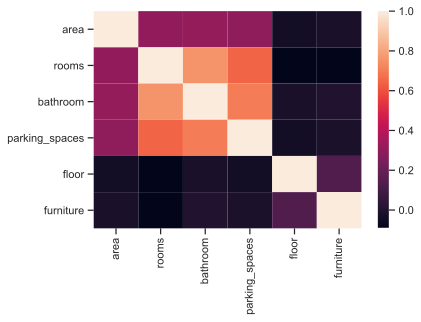

In [36]:
sns.heatmap(X_best.corr())

### Check the Variance Inflation Factor VIF

$VIF = 1/(1-R2_j)$

In [28]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as VIF

In [38]:
X1=add_constant(X_best)

In [39]:
vifs=pd.Series([VIF(X_best.values,i) for i in range(X_best.shape[1])],index=X_best.columns)

In [40]:
vifs

area               1.367811
rooms              9.377799
bathroom          10.944873
parking_spaces     4.644397
floor              1.651802
furniture          1.334053
dtype: float64

In [90]:
df_vifs=pd.DataFrame(vifs)
df_vifs.columns=['VIF values']

In [91]:
df_vifs

,VIF values
area,1.367811
rooms,9.377799
bathroom,10.944873
parking_spaces,4.644397
floor,1.651802
furniture,1.334053


In [45]:
def func(column,X):
    if column:
        X=X.drop(column, axis=1)
    vifs=pd.Series([VIF(X.values,i) for i in range(X.shape[1])],index=X.columns)
    display(vifs[vifs>10])
    return X

In [46]:
X2=X_best.copy()

In [47]:
X2=func('bathroom',X2)

Series([], dtype: float64)

In [49]:
vifs.sort_values(ascending=False)

bathroom          10.944873
rooms              9.377799
parking_spaces     4.644397
floor              1.651802
area               1.367811
furniture          1.334053
dtype: float64

In [50]:
df_vifs=pd.DataFrame(vifs.sort_values(ascending=False)[1:])
df_vifs.columns=['VIF values']
df_vifs

,VIF values
rooms,9.377799
parking_spaces,4.644397
floor,1.651802
area,1.367811
furniture,1.334053


In [51]:
print('shape of X2 is', X2.shape)
print('shape of X_best is', X_best.shape)

shape of X2 is (5887, 5)
shape of X_best is (5887, 6)


Here there is no more collinearity.

Let's have a look again on our model

In [52]:
sm.OLS(y,add_constant(X2)).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rent_amount   R-squared:                       0.425
Model:                            OLS   Adj. R-squared:                  0.424
Method:                 Least Squares   F-statistic:                     867.8
Date:                Sun, 03 May 2020   Prob (F-statistic):               0.00
Time:                        10:15:35   Log-Likelihood:                -54989.
No. Observations:                5887   AIC:                         1.100e+05
Df Residuals:                    5881   BIC:                         1.100e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            -49.1214    100.335     -0.490      0.624    -245.815     147.572
area               0.8341      0.110      7.595      0.000       0.619       1.049
rooms            953.0358     41.154     23.158      0.000     872.358    1033.714
parking_spaces   771.0881     28.206     27.338      0.000     715.795     826.381
floor             51.8613      6.013      8.625      0.000      40.073      63.649
furniture       1445.5380     82.027     17.623      0.000    1284.734    1606.342
==============================================================================
Omnibus:                     2076.265   Durbin-Watson:                   2.013
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            17663.170
Skew:                           1.446   Prob(JB):                         0.00
Kurtosis:                      10.978   Cond. No.                     1.16e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.16e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

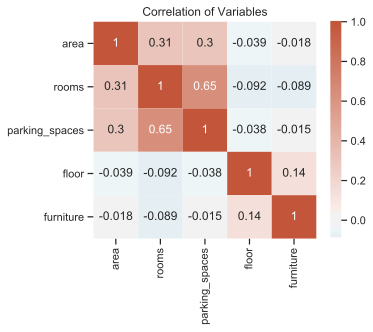

In [53]:
# Plotting the heatmap
plt.figure(figsize = (5,4))
sns.heatmap((X2).corr(), annot=len(X.columns)<10, center=0, cmap=sns.diverging_palette(220, 20, as_cmap=True))
plt.title('Correlation of Variables')
plt.show()

In [55]:
#check again the multicollinearity to be sure
X2=func('',X2)

Series([], dtype: float64)

We've check the Multicollinearity Assumption. And it is satisfied. We dropped the column 'animal' which has a high collinearity with other columns.

## Autocorrelation - when rows are correlated

Here we gonna apply the durbin_watson test

In [57]:
from statsmodels.stats.stattools import durbin_watson

In [57]:
mod=sm.OLS(y,add_constant(X2)).fit()
resid=mod.resid

In [58]:
durbin_watson(resid)

2.0132066657996748

Autocorrelation assumption is satisfied cause the durbin_watson test gave us a value of close to 2 which is the range (1.5<x<2.5) of no autocorrelation.

## Linearity

In [59]:
X2.nunique()[X2.nunique()>2].index

Index(['area', 'rooms', 'parking_spaces', 'floor'], dtype='object')

In [60]:
_,axes=plt.subplots(2,2,figsize=(10,5))
for idx,col in enumerate(X2.nunique()[X2.nunique()>2].index):
    sns.scatterplot(x=X2[col].values,y=y.values.ravel(), ax=axes[idx//2, idx%2])

In [61]:
y_pred=mod.predict(add_constant(X2))
y_pred;

Text(0.5, 1.0, 'Sao Paulo - predicted rent amount- model 1')

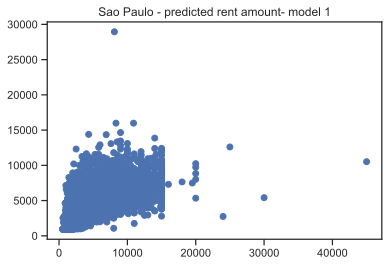

In [62]:
#f, axe = plt.subplots(1, 1,figsize=(8,4))
plt.scatter(y,y_pred)
plt.title('Sao Paulo - predicted rent amount - model 1')

In [63]:
lin_df_test=pd.concat([y,y_pred],axis=1)

In [64]:
lin_df_test.columns=['rent_amount','pred']

Text(0.5, 1.0, 'São Paulo Predicted rent amount - model 1')

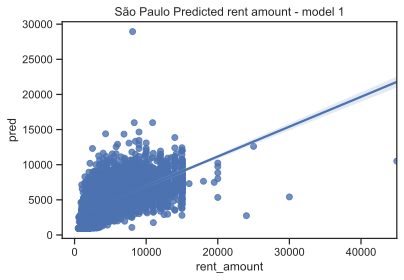

In [168]:
sns.regplot(lin_df_test.rent_amount, lin_df_test.pred)
ax=plt.gca()
ax.set_title('São Paulo Predicted rent amount - model 1')

From this 2 plots, we can see that the linearity is not clearly reached. We gonna need to change our approach of the data fixed it.

For now, let's finish to verify the other assumptions, before to change our approach.

## Homoskedasticity

In [69]:
from statsmodels.stats.diagnostic import het_breuschpagan

In [68]:
lnames=['Lagrange Multiplier','pvalue for LM','F stats','pvalue for Fstats']
dic={lnames[idx]:het_breuschpagan(resid,X2)[idx] for idx in range(4)}
HS_table=pd.DataFrame.from_dict(dic, orient='index')
HS_table.columns=['HS_test_values']
HS_table

,HS_test_values
Lagrange Multiplier,1.169263e+03
pvalue for LM,7.333752e-252
F stats,2.915638e+02
pvalue for Fstats,1.658649e-279


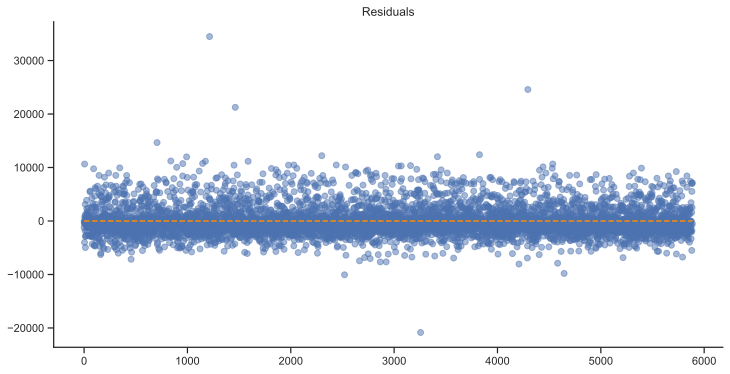

In [72]:
# Plotting the residuals
from numpy import repeat
plt.subplots(figsize=(12, 6))
ax = plt.subplot(111)  # To remove spines
plt.scatter(x=range(X2.shape[0]), y=resid, alpha=0.5)
plt.plot(repeat(0, X2.shape[0]), color='darkorange', linestyle='--')
ax.spines['right'].set_visible(False)  # Removing the right spine
ax.spines['top'].set_visible(False)  # Removing the top spine
plt.title('Residuals')
plt.show()

Homoskedasticity test show us that both p value for LM and Fstats are close to 0, therefore we reject NUll hypothesis and end up in Heteroskedasticity.

Assumption is violated

As for the linearity, we can fix this by transform our data. Maybe built a new model or split again our data based on outliers and non-outliers.

## Exogeneity of residuals

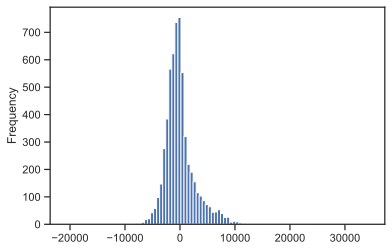

In [73]:
resid.plot.hist(bins=100)

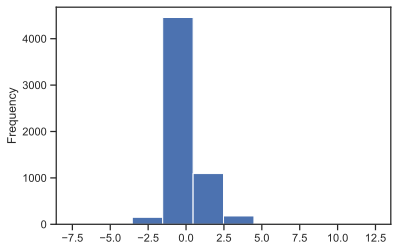

In [74]:
((resid-resid.mean())/resid.std()).plot.hist()

Text(0.5, 1.0, 'São Paulo - Distribution of residual- model 1')

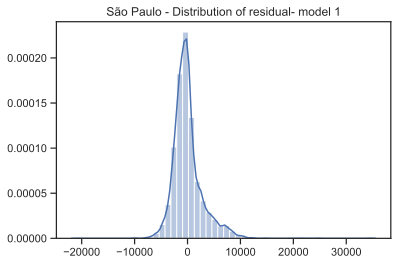

In [85]:
sns.distplot(resid)
ax=plt.gca()
ax.set_title('São Paulo - Distribution of residual- model 1')

In [78]:
from scipy.stats import kstest

In [87]:
kstest(resid, 'norm')#check the goodness of fit, or see if we our series follow another distribution

KstestResult(statistic=0.593042471603667, pvalue=0.0)

H0= resid follows Norm

H1= resid doesn't follow Norm

In [29]:
from scipy.stats import probplot
import pylab

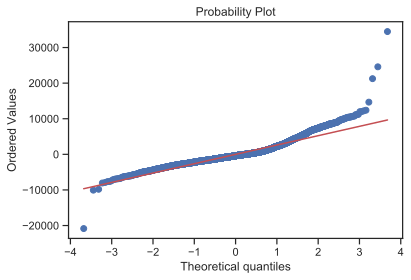

In [89]:
probplot(resid, dist='norm', plot=pylab);

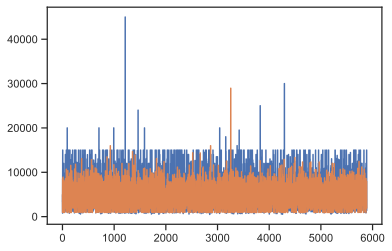

In [80]:
plt.plot(y)
plt.plot(y_pred)

In [81]:
resid.mean()

8.22064946738007e-11

In [82]:
resid.std()

2757.1077159154866

In [83]:
std_list=[]
for i in range(100):
    std_list.append(resid.sample(1000).std())
sum(std_list)/100

2784.567201357478

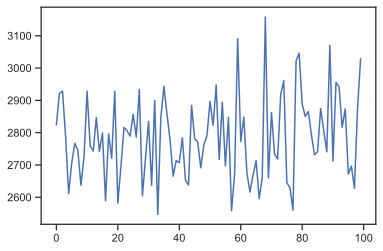

In [84]:
plt.plot(std_list)

Conclusion:
    1. Multicollinearity assumption is satisfied. By removing the highly correlated column with other ('bathroom')
    2. No autocorrelation assumption is satisfied. Durbin_watson test is close to 2, so in the range of no autocorrelation.
    3. Linearity assumption is not satisfied. We need change our approach to the data by transforming it.
    4. Homoskedasticity. Same than the linearity.
    5. Exogeneity assumption is not satisfied neither. We see that we have strong ouliers. The average error is 0 but std is not stable.
    
We can't used the model as it is for real prediction. But we can use it to describe relationships between variables.

DESCRIBE, NOT PREDICT.

# New model
To built this new model, we're consider 2 more elements and try to make it work:
1. Use the log on our column 'rent_mount' to fix the linearity
2. Remove the column 'animal' to be able to proceed to the linear_harvey_collier test also to fix the linearity

In [30]:
df2=data.copy()

In [31]:
df2.head(2)

,city,area,rooms,bathroom,parking_spaces,floor,animal,furniture,hoa,rent_amount,property_tax,fire_insurance,total
0,São Paulo,70,2,1,1,7,1,1,2065,3300,211,42,5618
1,São Paulo,320,4,4,0,20,1,0,1200,4960,1750,63,7973


In [32]:
column_to_drop=['city','animal','hoa','property_tax','fire_insurance','total']

In [33]:
df2.drop(column_to_drop, axis=1, inplace=True)

In [34]:
df2.head(2)

,area,rooms,bathroom,parking_spaces,floor,furniture,rent_amount
0,70,2,1,1,7,1,3300
1,320,4,4,0,20,0,4960


In [35]:
df2.shape

(5887, 7)

In [36]:
y=np.log(df2.rent_amount)
X=df2.drop('rent_amount', axis=1)

In [37]:
model2=sm.OLS(y,add_constant(X))

In [38]:
model_fit2=model2.fit()

In [39]:
model_fit2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rent_amount   R-squared:                       0.554
Model:                            OLS   Adj. R-squared:                  0.554
Method:                 Least Squares   F-statistic:                     1217.
Date:                Sun, 03 May 2020   Prob (F-statistic):               0.00
Time:                        16:52:20   Log-Likelihood:                -4208.5
No. Observations:                5887   AIC:                             8431.
Df Residuals:                    5880   BIC:                             8478.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              7.0590      0.018    392.138      0.000       7.024       7.094
area             8.91e-05   1.98e-05      4.506      0.000    5.03e-05       0.000
rooms              0.1174      0.009     13.163      0.000       0.100       0.135
bathroom           0.1781      0.007     24.111      0.000       0.164       0.193
parking_spaces     0.0990      0.006     17.797      0.000       0.088       0.110
floor              0.0146      0.001     13.481      0.000       0.012       0.017
furniture          0.3381      0.015     22.882      0.000       0.309       0.367
==============================================================================
Omnibus:                       34.760   Durbin-Watson:                   2.022
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.771
Skew:                           0.173   Prob(JB):                     1.71e-08
Kurtosis:                       3.161   Cond. No.                     1.17e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Here we ended up with a model with quite good result, but we need to test the assumptions.

In [40]:
model_fit2.save("fitted_model_SP2.pickle")# Let's save our model

In [41]:
fitted_model=sm.load('fitted_model_SP2.pickle')

In [42]:
fitted_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rent_amount   R-squared:                       0.554
Model:                            OLS   Adj. R-squared:                  0.554
Method:                 Least Squares   F-statistic:                     1217.
Date:                Sun, 03 May 2020   Prob (F-statistic):               0.00
Time:                        16:52:25   Log-Likelihood:                -4208.5
No. Observations:                5887   AIC:                             8431.
Df Residuals:                    5880   BIC:                             8478.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              7.0590      0.018    392.138      0.000       7.024       7.094
area             8.91e-05   1.98e-05      4.506      0.000    5.03e-05       0.000
rooms              0.1174      0.009     13.163      0.000       0.100       0.135
bathroom           0.1781      0.007     24.111      0.000       0.164       0.193
parking_spaces     0.0990      0.006     17.797      0.000       0.088       0.110
floor              0.0146      0.001     13.481      0.000       0.012       0.017
furniture          0.3381      0.015     22.882      0.000       0.309       0.367
==============================================================================
Omnibus:                       34.760   Durbin-Watson:                   2.022
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.771
Skew:                           0.173   Prob(JB):                     1.71e-08
Kurtosis:                       3.161   Cond. No.                     1.17e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Assumptions for model2

In [43]:
fitted_model.params.index

Index(['const', 'area', 'rooms', 'bathroom', 'parking_spaces', 'floor',
       'furniture'],
      dtype='object')

In [44]:
XX_best=X[fitted_model.params.index[1:]]

In [45]:
XX_best.shape

(5887, 6)

In [46]:
#Check model on XX_best
sm.OLS(y,add_constant(XX_best)).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rent_amount   R-squared:                       0.554
Model:                            OLS   Adj. R-squared:                  0.554
Method:                 Least Squares   F-statistic:                     1217.
Date:                Sun, 03 May 2020   Prob (F-statistic):               0.00
Time:                        16:52:30   Log-Likelihood:                -4208.5
No. Observations:                5887   AIC:                             8431.
Df Residuals:                    5880   BIC:                             8478.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              7.0590      0.018    392.138      0.000       7.024       7.094
area             8.91e-05   1.98e-05      4.506      0.000    5.03e-05       0.000
rooms              0.1174      0.009     13.163      0.000       0.100       0.135
bathroom           0.1781      0.007     24.111      0.000       0.164       0.193
parking_spaces     0.0990      0.006     17.797      0.000       0.088       0.110
floor              0.0146      0.001     13.481      0.000       0.012       0.017
furniture          0.3381      0.015     22.882      0.000       0.309       0.367
==============================================================================
Omnibus:                       34.760   Durbin-Watson:                   2.022
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.771
Skew:                           0.173   Prob(JB):                     1.71e-08
Kurtosis:                       3.161   Cond. No.                     1.17e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Multicollinearity

In [47]:
XX_best.corr()

,area,rooms,bathroom,parking_spaces,floor,furniture
area,1.000000,0.306863,0.316543,0.300795,-0.038790,-0.018145
rooms,0.306863,1.000000,0.759432,0.645041,-0.092117,-0.088931
bathroom,0.316543,0.759432,1.000000,0.703530,-0.015503,0.005864
parking_spaces,0.300795,0.645041,0.703530,1.000000,-0.038378,-0.015155
floor,-0.038790,-0.092117,-0.015503,-0.038378,1.000000,0.135180
furniture,-0.018145,-0.088931,0.005864,-0.015155,0.135180,1.000000


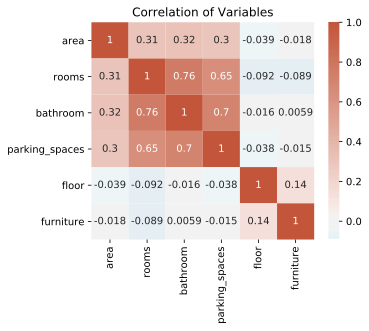

In [48]:
# Plotting the heatmap
plt.figure(figsize = (5,4))
sns.heatmap((XX_best).corr(), annot=len(X.columns)<10, center=0, cmap=sns.diverging_palette(220, 20, as_cmap=True))
plt.title('Correlation of Variables')
plt.show()

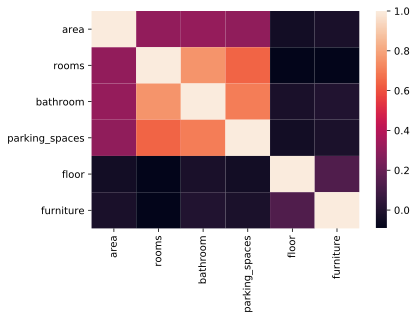

In [49]:
sns.heatmap(XX_best.corr())

### Variance Inflation Factor:

In [50]:
X1=add_constant(XX_best)

In [51]:
vifs=pd.Series([VIF(X1.values,i) for i in range(X1.shape[1])],index=X1.columns)

In [52]:
vifs[vifs>10]

Series([], dtype: float64)

In [53]:
df_vifs=pd.DataFrame(vifs.sort_values(ascending=False)[1:])
df_vifs.columns=['VIF values']
df_vifs

,VIF values
bathroom,2.961465
rooms,2.599713
parking_spaces,2.119292
area,1.134837
furniture,1.036011
floor,1.031082


There is no collinearity between the columns in this model.

In [54]:
#Lets check our model again
sm.OLS(y,X1).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            rent_amount   R-squared:                       0.554
Model:                            OLS   Adj. R-squared:                  0.554
Method:                 Least Squares   F-statistic:                     1217.
Date:                Sun, 03 May 2020   Prob (F-statistic):               0.00
Time:                        16:52:50   Log-Likelihood:                -4208.5
No. Observations:                5887   AIC:                             8431.
Df Residuals:                    5880   BIC:                             8478.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              7.0590      0.018    392.138      0.000       7.024       7.094
area             8.91e-05   1.98e-05      4.506      0.000    5.03e-05       0.000
rooms              0.1174      0.009     13.163      0.000       0.100       0.135
bathroom           0.1781      0.007     24.111      0.000       0.164       0.193
parking_spaces     0.0990      0.006     17.797      0.000       0.088       0.110
floor              0.0146      0.001     13.481      0.000       0.012       0.017
furniture          0.3381      0.015     22.882      0.000       0.309       0.367
==============================================================================
Omnibus:                       34.760   Durbin-Watson:                   2.022
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.771
Skew:                           0.173   Prob(JB):                     1.71e-08
Kurtosis:                       3.161   Cond. No.                     1.17e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Multicollinearity Assumption satisfied

## Autocorrelation - when rows are correlated

Durbin_watson test 

In [55]:
mod2=sm.OLS(y,add_constant(X1)).fit()
resid2=mod2.resid

In [58]:
durbin_watson(resid2)

2.021876644958824

Autocorrelation assumoption satified. Here again the durbin_watson test gave us a value close to 2, so in the range of no autocorrelation.

## Linearity

In [59]:
X1.nunique()[X1.nunique()>2].index

Index(['area', 'rooms', 'bathroom', 'parking_spaces', 'floor'], dtype='object')

In [60]:
_, axes = plt.subplots(3,2,figsize=(8,5))
for idx,col in enumerate(X1.nunique()[X1.nunique()>2].index):
    sns.scatterplot(x=X1[col].values,y=y.values.ravel(), ax=axes[idx//2,idx%2])

In [61]:
y_pred2=mod2.predict(add_constant(X1))

In [62]:
y_pred2;

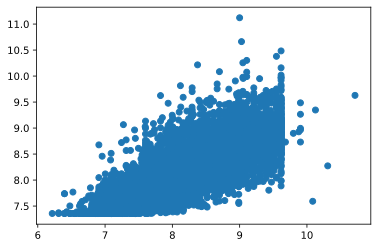

In [63]:
plt.scatter(y,y_pred2)

In [64]:
df_lin_test=pd.concat([y,y_pred2],axis=1)

In [65]:
df_lin_test.columns=['rent_amount','pred']

Text(0.5, 1.0, 'São Paulo Predicted rent amount - model 2')

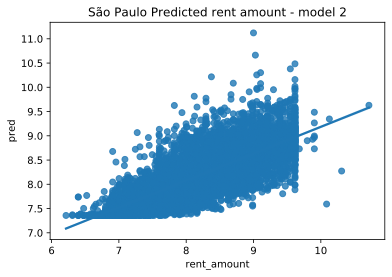

In [66]:
sns.regplot(df_lin_test.rent_amount, df_lin_test.pred)
ax=plt.gca()
ax.set_title('São Paulo Predicted rent amount - model 2')

Here can see better than in the frist model than the data follow a kind of linearity. Some outliers seems to be still not following it.

In my opinion, the linearity assumption is satisfied. We need to confirmed it.

### Linear Harvey-Collier test

In [67]:
linear_harvey_collier(mod2)

NameError: name 'linear_harvey_collier' is not defined

We still can't perform the linear Harvey-Collier test, it seems that the column furniture is also considered as dummies in our new dataset.

A solution would be here to remove it too.

At the stage, we cannot confirm once again that the linearity assumption is satified.

Log approach doesn't seem to be a right approach for our dataset.

## Homoskedasticity

In [70]:
lnames=['Lagrange Multiplier','pvalue for LM','F stat','pvalue for Fstats']
dic={lnames[idx]:het_breuschpagan(resid2,X1)[idx] for idx in range(4)}
HS_table=pd.DataFrame.from_dict(dic, orient='index')
HS_table.columns=['HS_test_values']

In [71]:
HS_table

,HS_test_values
Lagrange Multiplier,2.633825e+02
pvalue for LM,5.648082e-54
F stat,4.589836e+01
pvalue for Fstats,3.174781e-55


H0: the variance of residuals doesnt depend on Xs. (Homoskedasticity)

H1: Heteroskedasticity

Since in this case both values are 0, we reject Null Hypothesis and we end up in Heteroskedasticity. Assumption is violated

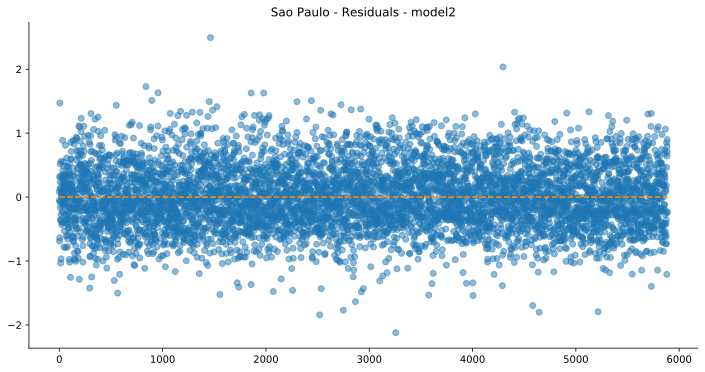

In [72]:
# Plotting the residuals
from numpy import repeat
plt.subplots(figsize=(12, 6))
ax = plt.subplot(111)  # To remove spines
plt.scatter(x=range(X1.shape[0]), y=resid2, alpha=0.5)
plt.plot(repeat(0, X1.shape[0]), color='darkorange', linestyle='--')
ax.spines['right'].set_visible(False)  # Removing the right spine
ax.spines['top'].set_visible(False)  # Removing the top spine
plt.title('Sao Paulo - Residuals - model2')
plt.show()

## Exogeneity of residuals

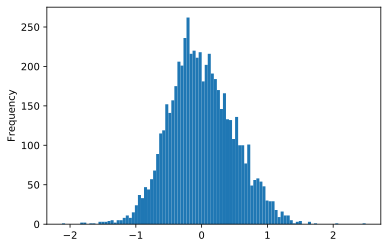

In [73]:
resid2.plot.hist(bins=100)

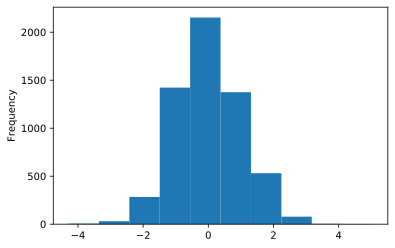

In [74]:
((resid2-resid2.mean())/resid2.std()).plot.hist()

Text(0.5, 1.0, 'São Paulo - Distribution of residual - model 2')

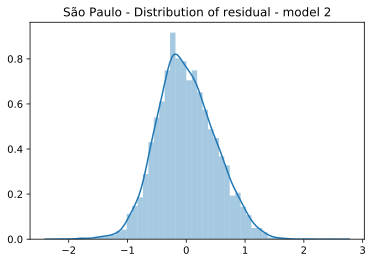

In [76]:
sns.distplot(resid2)
ax=plt.gca()
ax.set_title('São Paulo - Distribution of residual - model 2')

### Kolmogorov-Smirnov - KStest

In [79]:
kstest(resid2, 'norm')

KstestResult(statistic=0.17975460361577095, pvalue=1.1990450299345292e-165)

The distribution seems to follow normality now.

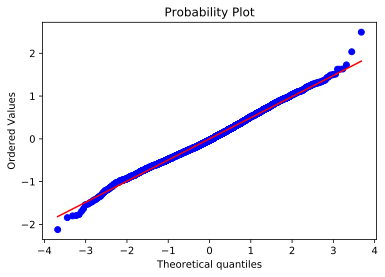

In [80]:
probplot(resid2, dist='norm', plot=pylab);

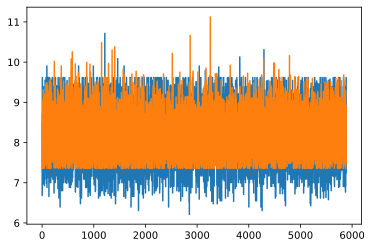

In [81]:
plt.plot(y)
plt.plot(y_pred2)

In [82]:
print(resid2.mean())
print(resid2.std())

1.7087575150022825e-13
0.4946129638073755


### Standard Deviation analysis

In [83]:
std_list=[]
for i in range(100):
    std_list.append(resid2.sample(1000).std())
sum(std_list)/100

0.4955657204634852

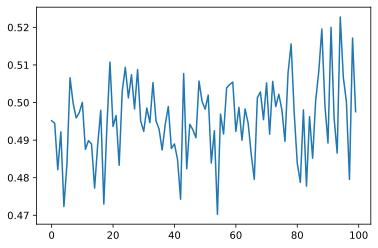

In [84]:
plt.plot(std_list)

We can see the std average is really to 0 but the effect of the oultliers are reduce.

# Conclusions:
    1. Multicollinearity - satisfied. Our update approach didn't affect the model for this one.
    2. No autocorrelation - satisfied. Same thing here the update model is already avoiding the position to fail on this assumption.
    3. Linearity - satisfied. with this updated model, we get closer to the linearity of the data. But it seems that we can do better by hanlding the outliers.
    4. Homoskedasticity - failed. Same statement: need to handle the ouliers
    5. Exogeneity - failed. 